# Staying safe during your trip - Accidents in the US (Feb 2016 - Mar 2023)

Data Visualisation - Project by Laura Ehlert Moreno (DHBW Stuttgart | WWI2023F | Semester 2 | Florian Eichin)

This Jupyter Notebook will concentrate on analysing a dataset on Accidents in the US.

"This is a countrywide car accident dataset that covers 49 states of the USA. The accident data were collected from February 2016 to March 2023, using multiple APIs that provide streaming traffic incident (or event) data. These APIs broadcast traffic data captured by various entities, including the US and state departments of transportation, law enforcement agencies, traffic cameras, and traffic sensors within the road networks. The dataset currently contains approximately 7.7 million accident records."
(source: https://smoosavi.org/datasets/us_accidents)

There are two datasets available (on Kaggle):
- US_Accidents_March23 (**7,728,394** rows x 46 col)
- US_Accidents_March23_sampled_500k (**500,000** rows x 46 col)

Those visuals that will be used in the final dashboard are marked with '---->>' and the title is bold. For the rest of the visuals, there is an annotation as to why they are excluded from the analysis.

The larger the dataset, the more valuable the insights. However, one may use the smaller dataset if they want to reduce the time it takes to load the information. Feel free to select the chosen path in the following cell by removing the comment (#) at the respective file path:

In [1]:
import pandas as pd
import plotly as plt
import numpy as np
import matplotlib.pyplot as pp
import plotly.graph_objects as go
import plotly.io as pio
import holidays
# choose which file to use
#df = pd.read_csv('../data/US_Accidents_March23_sampled_500k.csv')
df = pd.read_csv('../data/US_Accidents_March23.csv')

The graphs and code (including this Jupyter Notebook) will be written in English in order to make them available to a much broader target group, since the insights that are being generated are highly relevant for people living in the US as well as tourists who are planning their trip to the US.

## A) Inspecting the data

In [2]:
df.head(10)

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.01,...,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,0.01,...,False,False,False,False,True,False,Day,Day,Day,Day
5,A-6,Source2,3,2016-02-08 07:44:26,2016-02-08 08:14:26,40.100590,-82.925194,NaN,NaN,0.01,...,False,False,False,False,False,False,Day,Day,Day,Day
6,A-7,Source2,2,2016-02-08 07:59:35,2016-02-08 08:29:35,39.758274,-84.230507,NaN,NaN,0.00,...,False,False,False,False,False,False,Day,Day,Day,Day
7,A-8,Source2,3,2016-02-08 07:59:58,2016-02-08 08:29:58,39.770382,-84.194901,NaN,NaN,0.01,...,False,False,False,False,False,False,Day,Day,Day,Day
8,A-9,Source2,2,2016-02-08 08:00:40,2016-02-08 08:30:40,39.778061,-84.172005,NaN,NaN,0.00,...,False,False,False,False,False,False,Day,Day,Day,Day
9,A-10,Source2,3,2016-02-08 08:10:04,2016-02-08 08:40:04,40.100590,-82.925194,NaN,NaN,0.01,...,False,False,False,False,False,False,Day,Day,Day,Day


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7728394 entries, 0 to 7728393
Data columns (total 46 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Source                 object 
 2   Severity               int64  
 3   Start_Time             object 
 4   End_Time               object 
 5   Start_Lat              float64
 6   Start_Lng              float64
 7   End_Lat                float64
 8   End_Lng                float64
 9   Distance(mi)           float64
 10  Description            object 
 11  Street                 object 
 12  City                   object 
 13  County                 object 
 14  State                  object 
 15  Zipcode                object 
 16  Country                object 
 17  Timezone               object 
 18  Airport_Code           object 
 19  Weather_Timestamp      object 
 20  Temperature(F)         float64
 21  Wind_Chill(F)          float64
 22  Humidity(%)       

## B) Cleaning/Transforming the Data

How to deal with nan values: Do not drop all rows with Nan values of the main dataset because too much valuable data would be lost. Rather create subsets in the following and then readjust/delete inneccessary information.

### 1) Creating separate datasets for POIs and weather

In [4]:
poi_df = df[['ID', 'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop', 'Turning_Loop', 'Amenity', 'Traffic_Signal']].reset_index()
poi_df['Count'] = 1

In [5]:
weather_df = df[['Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)', 'Severity', 'Distance(mi)']]

### 2) Dropping columns that are not needed

In [6]:
df.drop(columns=['Source', 'Description', 'Airport_Code', 'Civil_Twilight', 'Country', 'Astronomical_Twilight', 'End_Lat', 'End_Lng', 'Weather_Condition', 'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop', 'Turning_Loop', 'Traffic_Signal', 'Amenity', 'Traffic_Calming', 'Weather_Timestamp', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Wind_Direction', 'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)', 'Timezone', 'Distance(mi)', 'Zipcode'], inplace=True)
df.reset_index(drop=True, inplace=True)

Drop all entries where we do not have the city (because this is only the case for a few entries)

In [7]:
df.dropna(subset=['City'], inplace=True)

In [8]:
df.shape

(7728141, 13)

In [9]:
df.columns

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'Street', 'City', 'County', 'State', 'Temperature(F)', 'Sunrise_Sunset',
       'Nautical_Twilight'],
      dtype='object')

### Columns with NaN and the sum of NaN values:

In [10]:
df[df.columns[df.isna().sum() > 0]].isna().sum()

Street                10869
Temperature(F)       163846
Sunrise_Sunset        22993
Nautical_Twilight     22993
dtype: int64

### 3) Rows containing time: Converting and adding values

- convert to 'datetime' format
- add columns Year, Month, Day, Hour, Minute, Second
- add US holidays
- add weekdays

In [11]:
df['Start_Time'].head()

0    2016-02-08 05:46:00
1    2016-02-08 06:07:59
2    2016-02-08 06:49:27
3    2016-02-08 07:23:34
4    2016-02-08 07:39:07
Name: Start_Time, dtype: object

Creating a new subset 'dfTime': df copy + with more specific time information

In [12]:
#convert object to datetime for all time columns: Start_Time, End_Time, Weather_Timestamp
dfTime = df.copy()
dfTime['Start_Time'] = dfTime['Start_Time'].astype('object')
dfTime['Start_Time'] = pd.to_datetime(dfTime['Start_Time'], yearfirst=True, format='mixed')
#df2['Start_Time'].iloc[:5]
dfTime['End_Time'] = dfTime['End_Time'].astype('object')
dfTime['End_Time'] = pd.to_datetime(dfTime['End_Time'], yearfirst=True, format='mixed')

dfTime['Year'] = dfTime['Start_Time'].dt.year
dfTime['Month'] = dfTime['Start_Time'].dt.month
dfTime['Day'] = dfTime['Start_Time'].dt.day
dfTime['Hour'] = dfTime['Start_Time'].dt.hour
dfTime['Minute'] = dfTime['Start_Time'].dt.minute
dfTime['Second'] = dfTime['Start_Time'].dt.second
#add weekdays to dataframe
dfTime['Weekday'] = dfTime['Start_Time'].dt.day_name()

#add holidays to dataframe
us_holidays = holidays.US()
# Function to get holiday name and type
def get_holiday_info(date):
    holiday_info = us_holidays.get(date)
    if holiday_info:
        return holiday_info
    else:
        return None
# Create new columns for holiday
dfTime['Holiday_Name'] = (dfTime['Start_Time'].apply(get_holiday_info))

Now the dataframe will be sorted by Start_Time (won't produce any errors since there are no Nan values for this column)

In [13]:
dfTime = dfTime.sort_values(by='Start_Time') 
dfTime[['Start_Time', 'Year', 'Month', 'Day', 'Hour', 'Minute', 'Second', 'Weekday', 'Holiday_Name']].head(6)

,Start_Time,Year,Month,Day,Hour,Minute,Second,Weekday,Holiday_Name
3574624,2016-01-14 20:18:33,2016,1,14,20,18,33,Thursday,None
3571330,2016-01-14 20:18:33,2016,1,14,20,18,33,Thursday,None
3562512,2016-01-14 20:18:33,2016,1,14,20,18,33,Thursday,None
3562358,2016-01-14 20:18:33,2016,1,14,20,18,33,Thursday,None
3548830,2016-01-14 20:18:33,2016,1,14,20,18,33,Thursday,None
3548817,2016-01-14 20:18:33,2016,1,14,20,18,33,Thursday,None


### 4) Taking a look at 2020 and the consequences of the Covid-19 pandemic on traffic

Adding a column 'Count' with default value 1 to each row (1 row = 1 accident) -> will be useful later when it comes to counting the amount of accidents in a month/year/...

In [14]:
dfTime['Count'] = 1 #default value 1

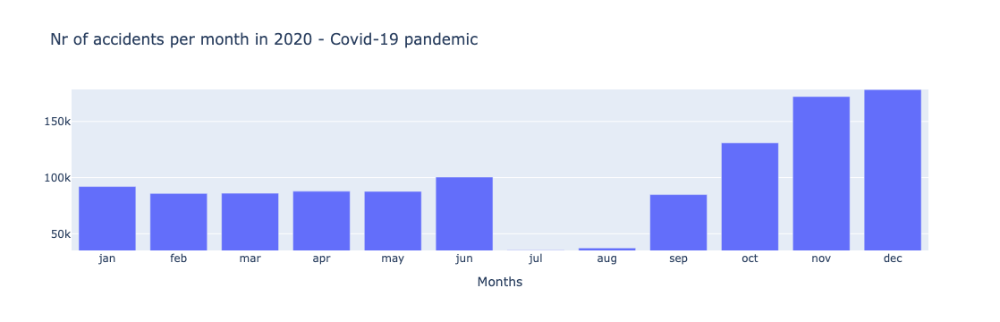

In [15]:
accByMonth = dfTime[dfTime['Year']==2020].groupby('Month')['Count'].sum()
fig = go.Figure()
fig.add_trace(go.Bar(
    x=list(range(1,13)),
    y=accByMonth))
fig.update_yaxes(range=[accByMonth.min()-100, accByMonth.max()+100]) # y-skala anpassen, damit dramatischer erscheint
fig.update_xaxes(title_text='Months', tickvals=list(range(1, 13)), ticktext=['jan','feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'])
fig.update_layout(title_text='Nr of accidents per month in 2020 - Covid-19 pandemic')
fig.show()
#pio.write_html(fig, './year2020.html', include_mathjax=False, include_plotlyjs=True)

Conclusion: The year 2020 will be **excluded** from this dataset and from further examination because it can be regarded as a year that was characterised by a strong decrease in commute traffic and logistics. Including those numbers in the analysis would alter the outcome significantly and therefore reduce the validity of the data. Hence, all accidents from 2020 will be removed from 'dfTime' and the index will be reset.
Source: https://www.cdc.gov/museum/timeline/covid19.html

In [16]:
dfTime = dfTime[dfTime['Year']!=2020]
dfTime.reset_index(drop=True, inplace=True) #reset index !
dfTime['Year'].unique()

array([2016, 2017, 2018, 2019, 2021, 2022, 2023], dtype=int32)

### 5) Creating subset 'only_ymd' for some aspects of investigation

Creating a subset grouping by year, month, day, weekday and calculating the sum of accidents per (week)day

In [17]:
df_only_ymd = dfTime.groupby(['Year', 'Month', 'Day', 'Weekday'])['Count'].sum().reset_index()

Now we need to assign the holidays to the days in our dataframe

In [18]:
# initialize US holidays
us_holidays = holidays.UnitedStates()
# function to get holiday name based on year, month, and day
def get_holiday_name(row):
    date = pd.Timestamp(year=row['Year'], month=row['Month'], day=row['Day'])
    return us_holidays.get(date, None)

# assign holiday names to dataframe
df_only_ymd['Holiday_Name'] = df_only_ymd.apply(get_holiday_name, axis=1)

### 6) There is a problem with how the holidays are named; For instance, 'New Years Day' appears twice, because there is a distinction between regular holidays and 'observed'.

In [19]:
dfTime['Holiday_Name'].unique()

array([None, "Washington's Birthday", 'Memorial Day', 'Independence Day',
       'Labor Day', 'Columbus Day', 'Veterans Day', 'Thanksgiving',
       'Christmas Day', 'Christmas Day (observed)', "New Year's Day",
       "New Year's Day (observed)", 'Martin Luther King Jr. Day',
       'Veterans Day (observed)',
       'Juneteenth National Independence Day (observed)',
       'Juneteenth National Independence Day',
       'Independence Day (observed)'], dtype=object)

When a holiday is labeled as 'observed', it means that the holiday is officially recognized and celebrated on a day that is different from its actual date (source: https://python-holidays.readthedocs.io/en/latest/api.html)
However, we want to regard the holiday itself and not whether it was observed or not. Hence, the 'observed' label will be removed in the following:

In [20]:
df_only_ymd['Holiday_Name_w/o_observed'] = df_only_ymd['Holiday_Name'].str.replace('(observed)', '').str.strip()

### 7) Creating a dictionary to set full name for each state abbreviation & add new column with full name

In [21]:
state_abbreviations = ['PA', 'OH', 'IN', 'KY', 'WV', 'CA', 'CT', 'NY', 'NE', 'NJ', 'IA', 'RI', 'MI', 'ME', 'MA', 'NH', 'MD', 'MO', 'DE', 'FL', 'VA', 'IL', 'GA', 'TN', 'WA', 'MN', 'SC', 'TX', 'CO', 'NC', 'AZ', 'DC', 'OR', 'MS', 'WI', 'UT', 'AL', 'OK', 'KS', 'LA', 'ID', 'NV', 'WY', 'VT', 'NM', 'MT', 'AR', 'SD', 'ND']

# Full names of the states
state_names = [
    'Pennsylvania', 'Ohio', 'Indiana', 'Kentucky', 'West Virginia', 'California', 'Connecticut', 'New York', 'Nebraska', 'New Jersey', 'Iowa',
    'Rhode Island', 'Michigan', 'Maine', 'Massachusetts', 'New Hampshire', 'Maryland', 'Missouri', 'Delaware', 'Florida', 'Virginia', 'Illinois',
    'Georgia', 'Tennessee', 'Washington', 'Minnesota', 'South Carolina', 'Texas', 'Colorado', 'North Carolina', 'Arizona', 'District of Columbia',
    'Oregon', 'Mississippi', 'Wisconsin', 'Utah', 'Alabama', 'Oklahoma', 'Kansas', 'Louisiana', 'Idaho', 'Nevada', 'Wyoming', 'Vermont', 'New Mexico',
    'Montana', 'Arkansas', 'South Dakota', 'North Dakota'
]

abbr_to_full = pd.DataFrame(data={'Abbreviation':state_abbreviations, 'Full_Name':state_names})

merged_df = dfTime.merge(abbr_to_full, how='left', left_on='State', right_on='Abbreviation')

# Create a new column with the full names of the states
dfTime['State_fullName'] = merged_df['Full_Name']

merged_df.drop(columns=['Abbreviation'], inplace=True) #drop redundant column
dfTime[['State', 'State_fullName']]

,State,State_fullName
0,PA,Pennsylvania
1,PA,Pennsylvania
2,PA,Pennsylvania
3,PA,Pennsylvania
4,PA,Pennsylvania
...,...,...
6549273,TX,Texas
6549274,MI,Michigan
6549275,CA,California
6549276,CA,California


### 8) Distinguishing between relative and absolute nr of accidents:

#### a) Top 6 holidays with highest sum of accidents (absolute):

In [22]:
df_only_ymd.groupby('Holiday_Name')['Count'].sum().reset_index().nlargest(5, 'Count')

,Holiday_Name,Count
8,Martin Luther King Jr. Day,21247
13,Veterans Day,20802
2,Columbus Day,20056
15,Washington's Birthday,19778
10,New Year's Day,14949


#### b) Conclusion: it would be more significant to regard all accidents in relation to the respective year (relative)

In [23]:
# calculate sum of accidents per year
totalAcc_perYearDf = df_only_ymd.groupby('Year')['Count'].sum().reset_index()
sumTotalAcc = len(dfTime) #sum of all accidents (2016-2023, without 2020)

df_only_ymd['Count_relativeToYear%'] = 0.0; # new column with default value 0 of type float64: relation to sum of accidents in respective year
df_only_ymd['Count_relativeTo_totalSum%'] = 0.0 # new column with relation to sum of total accidents

for index in range(len(df_only_ymd)): #iterate over all rows of df (over all days)
    currentYear = df_only_ymd.loc[index, 'Year']
    sumAccInYear = totalAcc_perYearDf[totalAcc_perYearDf['Year']==currentYear].iloc[0, 1] # get sum of accidents in respective year
    sumAccInDay = df_only_ymd.loc[index, 'Count'] # get sum of accidents on that day
    # calculate relation to year/to total sum, change to percent and round by 3 decimals
    df_only_ymd.loc[index, 'Count_relativeToYear%'] = round(((sumAccInDay/sumAccInYear) * 100), 3) #round to remove discrepancy
    df_only_ymd.loc[index, 'Count_relativeTo_totalSum%'] = round(((sumAccInDay/sumTotalAcc) * 100), 3)

## C) Storing the data as csv files for dashboard & checking for nan values/correct indexing

### 1) dataset for 2 visuals - 1)visual holidays & 2)visual accidents over the week 

In [24]:
# df_only_ymd.to_csv('../data/df_only_ymd.csv', index=True)

print(df_only_ymd.columns)
print(df_only_ymd.index)
df_only_ymd[df_only_ymd.columns[df_only_ymd.isna().sum() > 0]].isna().sum()

Index(['Year', 'Month', 'Day', 'Weekday', 'Count', 'Holiday_Name',
       'Holiday_Name_w/o_observed', 'Count_relativeToYear%',
       'Count_relativeTo_totalSum%'],
      dtype='object')
RangeIndex(start=0, stop=2206, step=1)


Holiday_Name                 2132
Holiday_Name_w/o_observed    2132
dtype: int64

### 3) dataset for Average Accidents per Hour by different Months (scatter 12x)

In [26]:
df_avgHourlyMonth = dfTime[~dfTime['Weekday'].isin(['Saturday', 'Sunday'])].reset_index() #exclude weekend
df_avgHourlyMonth = df_avgHourlyMonth[['ID', 'State_fullName', 'Year', 'Month', 'Day', 'Hour', 'Minute', 'Second', 'Count']]

# df_avgHourlyMonth.to_csv('../data/df_avgHourlyMonth.csv', index=True)

print(df_avgHourlyMonth.columns)
print(df_avgHourlyMonth.index)
df_avgHourlyMonth[df_avgHourlyMonth.columns[df_avgHourlyMonth.isna().sum() > 0]].isna().sum()

Index(['ID', 'State_fullName', 'Year', 'Month', 'Day', 'Hour', 'Minute',
       'Second', 'Count'],
      dtype='object')
RangeIndex(start=0, stop=5522692, step=1)


Series([], dtype: float64)

### 4) dataset for the impact of temperature on accidents in dropdown(state)

In [25]:
df_tempMonthly = dfTime.drop(columns=['Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng', 'Street', 'City', 'County',
                                     'Sunrise_Sunset', 'Nautical_Twilight', 'Holiday_Name'], inplace=False)
print(df_tempMonthly.columns)
print(df_tempMonthly.index)
print(df_tempMonthly[df_tempMonthly.columns[df_tempMonthly.isna().sum() > 0]].isna().sum())

df_tempMonthly.dropna(subset=['Temperature(F)'], inplace=True) # drop nan values for temperature

# df_tempMonthly.to_csv('../data/df_tempMonthly.csv', index=True)

Index(['ID', 'State', 'Temperature(F)', 'Year', 'Month', 'Day', 'Hour',
       'Minute', 'Second', 'Weekday', 'Count', 'State_fullName'],
      dtype='object')
RangeIndex(start=0, stop=6549278, step=1)
Temperature(F)    132883
dtype: int64


### 5) dataset for Sum of accidents by different transport infrastructure

In [27]:
# poi_df.to_csv('../data/poi_df.csv', index=True)

print(poi_df.columns)
print(poi_df.index)
poi_df[poi_df.columns[poi_df.isna().sum() > 0]].isna().sum()

Index(['index', 'ID', 'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit',
       'Railway', 'Roundabout', 'Station', 'Stop', 'Turning_Loop', 'Amenity',
       'Traffic_Signal', 'Count'],
      dtype='object')
RangeIndex(start=0, stop=7728394, step=1)


Series([], dtype: float64)

### 6) dataset for accidents on scattermap: dropdown(state) dropdown(county) & most affected streets in county

In [28]:
df_accScattermap = dfTime.drop(columns=['Temperature(F)', 'Sunrise_Sunset', 'Nautical_Twilight', 'Holiday_Name'], inplace=False)
print(df_accScattermap.columns)
print(df_accScattermap.index)
print(df_accScattermap[df_accScattermap.columns[df_accScattermap.isna().sum() > 0]].isna().sum())

# dropping nan values for street
df_accScattermap.dropna(subset=['Street'], inplace=True)

# df_accScattermap.to_csv('../data/df_accScattermap.csv', index=True)

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'Street', 'City', 'County', 'State', 'Year', 'Month', 'Day', 'Hour',
       'Minute', 'Second', 'Weekday', 'Count', 'State_fullName'],
      dtype='object')
RangeIndex(start=0, stop=6549278, step=1)
Street    10432
dtype: int64


---------------------------------------------------

## D) Data Analysis - generating insights

### Taking a look at the impact of holidays on accidents:

Mean sum of accidents by holiday

In [29]:
dfcop = df_only_ymd.copy()
df = round((dfcop.groupby(['Year', 'Holiday_Name_w/o_observed'])['Count'].sum().reset_index().groupby('Holiday_Name_w/o_observed')['Count'].mean())).nlargest(100).reset_index()
df.index = df.index+1
df

,Holiday_Name_w/o_observed,Count
1,Juneteenth National Independence Day,8502.0
2,Veterans Day,4474.0
3,New Year's Day,4137.0
4,Martin Luther King Jr. Day,3541.0
5,Columbus Day,3343.0
6,Washington's Birthday,2825.0
7,Christmas Day,2823.0
8,Labor Day,2348.0
9,Independence Day,2340.0
10,Memorial Day,1786.0


In [30]:
df_only_ymd.columns

Index(['Year', 'Month', 'Day', 'Weekday', 'Count', 'Holiday_Name',
       'Holiday_Name_w/o_observed', 'Count_relativeToYear%',
       'Count_relativeTo_totalSum%'],
      dtype='object')

#### ------>> FINAL VISUAL: **Top 5 holidays with the highest accident rate**

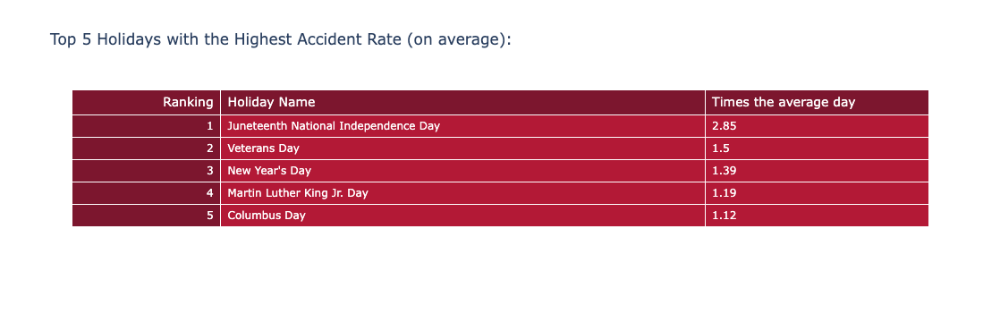

In [31]:
dfcop = df_only_ymd.copy()

# average accident rate on regular days
avgAccRate = round(df_only_ymd[df_only_ymd['Holiday_Name_w/o_observed'].isna()]['Count'].mean())

table_df = round((dfcop.groupby(['Year', 'Holiday_Name_w/o_observed'])['Count'].sum().reset_index().groupby('Holiday_Name_w/o_observed')['Count'].mean()), 0).nlargest(5).reset_index()
table_df.index = table_df.index + 1

table_df['Times the average day'] = round((table_df['Count']/avgAccRate),2)

col2 = '#b31936'
col1 = '#7c162e'

fig = go.Figure(data=[go.Table(columnorder = [1, 2, 3], columnwidth = [40, 130, 60],
                               
                               header=dict(values=['Ranking', 'Holiday Name', 'Times the average day'],
                                          line_color='white',
                                          fill_color=col1,
                                           font=dict(color='white', size=14),
                                          align=['right', 'left', 'left']),
                               
                               cells=dict(values=[table_df.index, table_df['Holiday_Name_w/o_observed'], table_df['Times the average day']], align=['right', 'left', 'left'],
                              font=dict(color=['white', 'white', 'white', 'white'], size=12), height=25, fill=dict(color=[col1, col2, col2])))
                     ])
fig.update_layout(title="Top 5 Holidays with the Highest Accident Rate (on average):", width=800)

# save as html
# pio.write_html(fig, 'html-figures/holiday_figure.html', include_mathjax=False, include_plotlyjs=True)

fig.show()

#### Are holidays disproportionately affected by accidents compared to regular days?

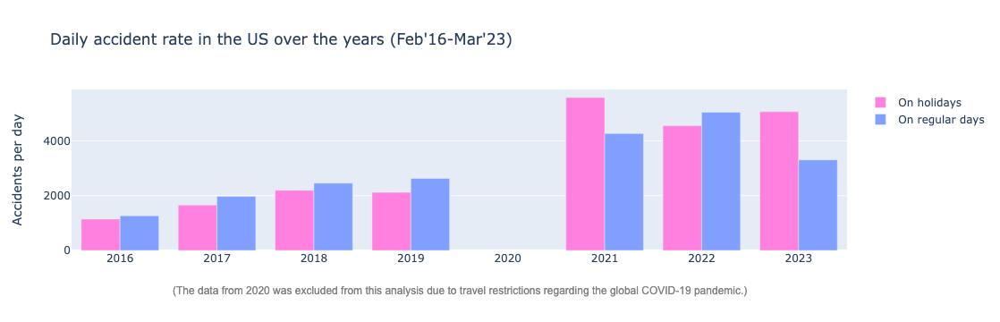

In [32]:
def accRate_onHol (year): #returns accident rate on holidays by specified year, rounded by 2 decimals
    df_only_ymd20xx = df_only_ymd[df_only_ymd['Year']==year]
    #wir gehen von 100% aus für das gesamte Jahr
    sumAccHol_20xx = df_only_ymd20xx.groupby('Holiday_Name_w/o_observed')['Count'].sum().sum()
    nrOfHol_in20xx = len(df_only_ymd20xx.groupby('Holiday_Name_w/o_observed'))
    return np.round((sumAccHol_20xx / nrOfHol_in20xx), 2)

def accRate_onReg (year): #returns accident rate on regular days by specified year, rounded by 2 decimals
    df_only_ymd20xx = df_only_ymd[df_only_ymd['Year']==year]
    sumAccReg_20xx = df_only_ymd20xx[df_only_ymd20xx['Holiday_Name_w/o_observed'].isna()]['Count'].sum()
    nrOfReg_in20xx = len(df_only_ymd20xx) - len(df_only_ymd20xx.groupby('Holiday_Name_w/o_observed')) #all days - nr of holidays
    return np.round((sumAccReg_20xx / nrOfReg_in20xx), 2)

#make a df to save rates for each year
df_rates = pd.DataFrame({'Year':[2016, 2017, 2018, 2019, 2021, 2022, 2023]})
df_rates['Holiday_rate'] = 0
df_rates['Regular_rate'] = 0
holRates = []
regRates = []
for year in [2016, 2017, 2018, 2019, 2021, 2022, 2023]:
    holRates.append(accRate_onHol(year))
    regRates.append(accRate_onReg(year))
    
df_rates['Holiday_rate'] = holRates
df_rates['Regular_rate'] = regRates

#create bar graph
fig = go.Figure()
bar_holidays = go.Bar(x=df_rates['Year'], y=df_rates['Holiday_rate'], name='On holidays', marker_color='rgb(255, 128, 223)')
bar_regular = go.Bar(x=df_rates['Year'], y=df_rates['Regular_rate'], name='On regular days', marker_color='rgb(128, 159, 255)')
fig.add_traces([bar_holidays, bar_regular])
fig.update_layout(title='Daily accident rate in the US over the years (Feb\'16-Mar\'23)', yaxis=dict(title='Accidents per day'),
    annotations=[dict(
        text="(The data from 2020 was excluded from this analysis due to travel restrictions regarding the global COVID-19 pandemic.)",
        showarrow=False,
        xref="paper",
        yref="paper",
        x=0.5,
        y=-0.3,
        font=dict(
            family="Arial",
            size=12,
            color="grey"
        )
    )])
            
    
fig.show()

With exception of 2021 and 2023, holidays do not seem to have a higher accident rate than regular days. This might be due to the fact that on holidays, there is a decrease in goods delivery traffic and commuter traffic.

##### Adding the day before and after a holiday into the analysis:

In [33]:
#create new column to insert 1 (holiday or 1 day apart from holiday) or 0
#first: sort by year, month, day

df_only_ymd['Holiday_or_NearTo'] = 0 #default value None
#iterate over all rows of dataframe
for index in range(len(df_only_ymd)-1):  # Iterate over all rows of the DataFrame
    current = pd.notna(df_only_ymd.loc[index, 'Holiday_Name_w/o_observed'])
    after = pd.notna(df_only_ymd.loc[index + 1, 'Holiday_Name_w/o_observed'])
    
    if index > 0:
        previous = pd.notna(df_only_ymd.loc[index - 1, 'Holiday_Name_w/o_observed'])
    else:
        previous = False;  # Define previous for the first index
    
    if (current or previous or after):
        df_only_ymd.loc[index, 'Holiday_or_NearTo'] = 1
#df_only_ymd[df_only_ymd['Holiday_or_NearTo']==1].head(5)

On the basis of the calculation we may repeat the barplot:

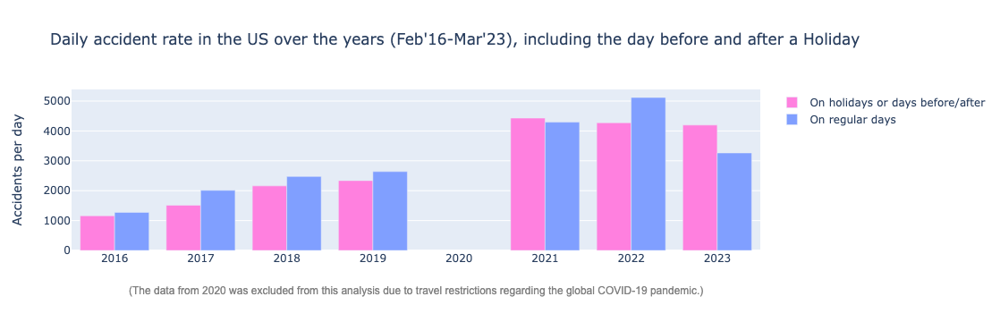

In [34]:
#we create the same visualisation as before whilst taking the day before+after into consideration as well

def accRate_onHolOrNears(year): #returns accident rate on holidays or near days by specified year, rounded by 2 decimals
    df_only_ymd20xx = df_only_ymd[df_only_ymd['Year']==year]
    #wir gehen von 100% aus für das gesamte Jahr
    sumAccHolOrNears_20xx = df_only_ymd20xx[df_only_ymd20xx['Holiday_or_NearTo']==1]['Count'].sum()
    nrOfHolOrNears_in20xx = len(df_only_ymd20xx[df_only_ymd20xx['Holiday_or_NearTo']==1])
    return np.round((sumAccHolOrNears_20xx / nrOfHolOrNears_in20xx), 2)
    
def accRate_onRegNoNears(year): #returns accident rate on regular days without nears, by specified year, rounded by 2 decimals
    df_only_ymd20xx = df_only_ymd[df_only_ymd['Year']==year]
    sumAccRegNoNears_20xx = df_only_ymd20xx[df_only_ymd20xx['Holiday_or_NearTo']==0]['Count'].sum()
    nrOfRegNoNears_in20xx = len(df_only_ymd20xx[df_only_ymd20xx['Holiday_or_NearTo']==0])
    return np.round((sumAccRegNoNears_20xx / nrOfRegNoNears_in20xx), 2)
    

#make a df to save rates for each year
df_rates = pd.DataFrame({'Year':[2016, 2017, 2018, 2019, 2021, 2022, 2023]})
df_rates['HolidayOrNears_rate'] = 0
df_rates['RegularNoNears_rate'] = 0
holOrNearsRates = []
regNoNearsRates = []
for year in [2016, 2017, 2018, 2019, 2021, 2022, 2023]:
    holOrNearsRates.append(accRate_onHolOrNears(year))
    regNoNearsRates.append(accRate_onRegNoNears(year))
    
df_rates['HolidayOrNears_rate'] = holOrNearsRates
df_rates['RegularNoNears_rate'] = regNoNearsRates


#create bar graph
fig = go.Figure()
bar_holidays = go.Bar(x=df_rates['Year'], y=df_rates['HolidayOrNears_rate'], name='On holidays or days before/after', marker_color='rgb(255, 128, 223)')
bar_regular = go.Bar(x=df_rates['Year'], y=df_rates['RegularNoNears_rate'], name='On regular days', marker_color='rgb(128, 159, 255)')
fig.add_traces([bar_holidays, bar_regular])
fig.update_layout(title='Daily accident rate in the US over the years (Feb\'16-Mar\'23), including the day before and after a Holiday', yaxis=dict(title='Accidents per day'),
    annotations=[dict(
        text="(The data from 2020 was excluded from this analysis due to travel restrictions regarding the global COVID-19 pandemic.)",
        showarrow=False,
        xref="paper",
        yref="paper",
        x=0.5,
        y=-0.3,
        font=dict(
            family="Arial",
            size=12,
            color="grey"
        )
    )])
            
    
fig.show()


It still shows that holidays are not more affected by accidents in the majority of cases.

According to this article, the **week after** holidays is also affected by families travelling etc.
https://www.worktruckonline.com/10211723/are-holidays-the-most-dangerous-time-for-driver-safety#:~:text=During%20major%20holidays%2C%20the%20risks,compared%20to%20non%2Dholiday%20periods.

##### Considering the week after a holiday

In [35]:
df_only_ymd['Holiday_or_NearTo'] = 0 #default value None
#iterate over all rows of dataframe
for index in range(len(df_only_ymd)-1):  # Iterate over all rows of the DataFrame
    current = pd.notna(df_only_ymd.loc[index, 'Holiday_Name_w/o_observed'])
    #after = pd.notna(df_only_ymd.loc[index + 1, 'Holiday_Name'])
    if (current):
        for i in range (index, index+7):
            df_only_ymd.loc[i, 'Holiday_or_NearTo'] = 1
#df_only_ymd.iloc[200:240]

For the same barplot:

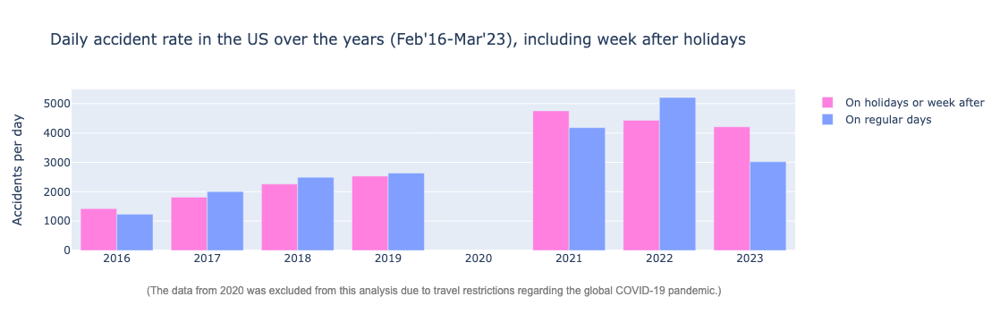

In [36]:
#we create the same visualisation as before whilst taking the week after the holiday into consideration as well

#make a df to save rates for each year
df_rates = pd.DataFrame({'Year':[2016, 2017, 2018, 2019, 2021, 2022, 2023]})
df_rates['HolidayOrNears_rate'] = 0
df_rates['RegularNoNears_rate'] = 0
holOrNearsRates = []
regNoNearsRates = []
for year in [2016, 2017, 2018, 2019, 2021, 2022, 2023]:
    holOrNearsRates.append(accRate_onHolOrNears(year))
    regNoNearsRates.append(accRate_onRegNoNears(year))
    
df_rates['HolidayOrNears_rate'] = holOrNearsRates
df_rates['RegularNoNears_rate'] = regNoNearsRates

#create bar graph
fig = go.Figure()
bar_holidays = go.Bar(x=df_rates['Year'], y=df_rates['HolidayOrNears_rate'], name='On holidays or week after', marker_color='rgb(255, 128, 223)')
bar_regular = go.Bar(x=df_rates['Year'], y=df_rates['RegularNoNears_rate'], name='On regular days', marker_color='rgb(128, 159, 255)')
fig.add_traces([bar_holidays, bar_regular])
fig.update_layout(title='Daily accident rate in the US over the years (Feb\'16-Mar\'23), including week after holidays', yaxis=dict(title='Accidents per day'),
    annotations=[dict(
        text="(The data from 2020 was excluded from this analysis due to travel restrictions regarding the global COVID-19 pandemic.)",
        showarrow=False,
        xref="paper",
        yref="paper",
        x=0.5,
        y=-0.3,
        font=dict(
            family="Arial",
            size=12,
            color="grey"
        )
    )])
            
fig.show()

https://www.arnolditkin.com/blog/motor-vehicle-accidents/5-types-of-dangerous-holiday-driving-hazards/

**final conclusion:** the analysis did not approve the inital hypothesis and we would need additional information in order to identify whether holidays are disproportionately affected by accidents. (For instance, it would be good to know the type of travel, such as family, commute, goods delivery, ...)

### Taking a look at different times of the year:

#### A) Deciding not to differentiate between the years

##### Daily accident rate over the course of [month] in [year]

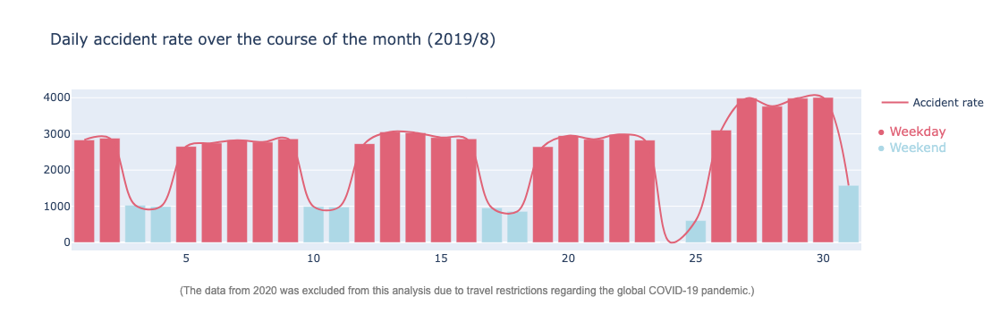

In [37]:
month = 8
year = 2019
accByDay = np.round((df_only_ymd[(df_only_ymd['Month']==month) & (df_only_ymd['Year']==year)].groupby(['Day', 'Weekday'])['Count'].sum()), 2)

weekday_color = '#e06377'  # Color for weekdays
weekend_color = 'lightblue'  # Color for weekends

# Map weekdays to numerical values (Monday=0, Sunday=6)
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_mapping = {day: i for i, day in enumerate(weekdays)}

# Create a color array based on weekdays
colors = [weekday_color if weekday_mapping[weekday] < 5 else weekend_color for _, weekday in accByDay.index]

fig2 = go.Figure()
bar = go.Bar(name='weekday',x=list(range(1,32)), y=accByDay, marker_color=colors, showlegend=False)
scatter = go.Scatter(name='Accident rate',x=list(range(1,32)), y=accByDay, mode='lines',
    line=dict(
        color=weekday_color,  # Customize the line color
        width=2,  # Customize the line width
        shape='spline'  # Make the lines rounded
    ))

fig2.update_layout(
    title='Daily accident rate over the course of the month' + ' ('+str(year)+'/'+str(month)+')',
    annotations=[
        dict(
            text='&#x25CF; Weekday',
            showarrow=False,
            xref="paper",
            yref="paper",
            x=1.11,  # Adjust the position to the right
            y=0.8,
            font=dict(
                size=14,
                color=weekday_color
            )
        ),
        dict(
            text='&#x25CF; Weekend',
            showarrow=False,
            xref="paper",
            yref="paper",
            x=1.11,  # Adjust the position to the right
            y=0.7,
            font=dict(
                size=14,
                color=weekend_color
            )
        ),
        dict(
            text="(The data from 2020 was excluded from this analysis due to travel restrictions regarding the global COVID-19 pandemic.)",
            showarrow=False,
            xref="paper",
            yref="paper",
            x=0.5,
            y=-0.3,
            font=dict(
                family="Arial",
                size=12,
                color="grey"
            )
        )
    ]
)
fig2.add_traces([bar, scatter])
fig2.show()

**Conclusion of A):** Do not select those graphics because we are not interested in the year, but rather in the trend over the years so that we can make informed decisions for the future. We want to discover trends; patterns that extend over the entire measurement period and provide clues about future developments.

#### B) Differentiate not by year, but by month/day etc.

##### Top 10 days with most accidents (average)

In [38]:
round((df_only_ymd.groupby(['Month', 'Day'])['Count'].mean()), 2).nlargest(10).reset_index()

,Month,Day,Count
0,1,25,5040.67
1,1,24,4588.67
2,12,13,4459.83
3,12,6,4454.00
4,12,23,4369.50
5,12,14,4363.67
6,11,15,4354.50
7,11,8,4342.83
8,12,15,4322.00
9,1,26,4246.83


#### Months with the highest accident rate on average

Relative to year:

In [39]:
(round(((df_only_ymd.groupby(['Year', 'Month'])['Count_relativeToYear%'].sum().reset_index().groupby('Month')['Count_relativeToYear%'].mean())), 2)).nlargest(10).reset_index().set_index('Month')

,Count_relativeToYear%
Month,
1,15.32
12,10.82
11,10.15
10,9.73
9,9.66
8,9.64
2,9.28
7,7.82
6,7.35


Absolute:

In [40]:
round((df_only_ymd.groupby(['Year', 'Month'])['Count'].sum().reset_index().groupby('Month')['Count'].mean()), 2).nlargest(5).reset_index().set_index('Month')
#sum(df_only_ymd.groupby('Month')['Count_relativeToYear%'].sum())

,Count
Month,
12,111478.50
11,97985.67
9,94421.00
1,94269.86
8,93720.83


#### -------->>FINAL VISUAL: **Impact of temperature on accidents in (state)**

Distinguish between different states:

Here, we choose a barplot and not a piechart despite using percentages, because we want to be able to identify a development over the course of the year (timeline)
Therefore, we clearly indicate that the y values are relative and not absolute by adding annotation
- for wyoming the critical wheather becomes very clear

In [41]:
df_tempMonthly['State_fullName'].unique()

array(['Pennsylvania', 'Ohio', 'Indiana', 'Kentucky', 'West Virginia',
       'Michigan', 'California', 'Connecticut', 'New Jersey', 'New York',
       'Massachusetts', 'Delaware', 'Nebraska', 'Rhode Island', 'Iowa',
       'Minnesota', 'Maryland', 'Missouri', 'Maine', 'New Hampshire',
       'South Dakota', 'Wisconsin', 'Nevada', 'Illinois',
       'South Carolina', 'Florida', 'Washington', 'Texas', 'Arkansas',
       'Tennessee', 'Virginia', 'Georgia', 'Louisiana', 'Kansas', 'Idaho',
       'Arizona', 'North Carolina', 'Utah', 'District of Columbia',
       'Colorado', 'Oklahoma', 'Oregon', 'Mississippi', 'Alabama',
       'New Mexico', 'Montana', 'Wyoming', 'Vermont', 'North Dakota'],
      dtype=object)

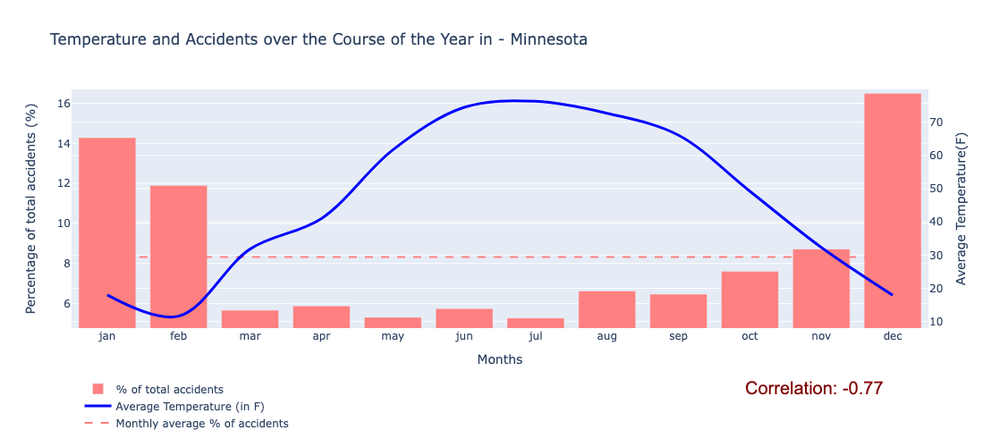

In [42]:
state = "Minnesota"

df_state = (df_tempMonthly[df_tempMonthly['State_fullName']==state]).reset_index()

#group by month and sum all accidents for each month, then for each month divide the total sum by the total sum of accidents ever recorded
df_percentages = round(((df_state.groupby(['Month'])['Count'].sum()/len(df_state))*100),2).reset_index().set_index('Month') # is sorted by month (1-12)
df_temperature = round((df_state.groupby(['Month'])['Temperature(F)'].mean()),1).reset_index().set_index('Month')
df_fig = pd.merge(df_percentages, df_temperature, on='Month')
df_fig = df_fig.rename(columns={'Count':'% of total accidents', 'Temperature(F)':'Average Temperature(F)'})

fig2 = go.Figure()
colors = ['#ff8080', '#ff8080', '#ff8080', '#ff8080', '#ff8080', '#ff8080', '#ff8080', '#ff8080', '#ff8080', '#ff8080', '#ff8080', '#ff8080']
bar_percentages = go.Bar(x=list(range(1,13)), y=df_fig['% of total accidents'], name='% of total accidents', marker_color=colors)
fig2.update_yaxes(range=[df_fig['% of total accidents'].min()-0.5, df_fig['% of total accidents'].max()+0.2])
#  adjust tick intervals so the changes are more obvious !!!
scatter_temperature = go.Scatter(x=list(range(1,13)), y=df_fig['Average Temperature(F)'], mode='lines', line=dict(width=3, color='blue', shape='spline'), name='Average Temperature (in F)', yaxis='y2')
fig2.add_traces([bar_percentages, scatter_temperature])
fig2.add_trace(go.Scatter(x=list(range(1,13)), y=[8.33]*12, name='Monthly average % of accidents', mode='lines', marker=dict(color='#ff8080'), line=dict(color='#ff8080', dash='dash')))

fig2.update_xaxes(title_text='Months', tickvals=list(range(1, 13)), ticktext=['jan','feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'])
fig2.update_layout(
    height=500,
    width=910,
title_text='Temperature and Accidents over the Course of the Year in - ' + state,
xaxis_title='Months',
yaxis=dict(title='Percentage of total accidents (%)'),
yaxis2=dict(title='Average Temperature(F)', overlaying='y', side='right'),
legend=dict(yanchor="top", y=-0.2, xanchor="left", x=0.01),
annotations=[dict(
text=("Correlation: "+str(round(df_fig['% of total accidents'].corr(df_fig['Average Temperature(F)']),2))),
showarrow=False,
xref="paper",
yref="paper",
x=0.95,
y=-0.3,
font=dict(
    family="Arial",
    size=20,
    color="#800000"
))])
fig2.show()

# pio.write_html(fig2, 'html-figures/temp_monthly.html', include_mathjax=False, include_plotlyjs=True)

very interesting!
- strongly negatively correlated: Florida, Minnesota, Missouri
- positively correlated: Delaware, New Jersey

In [43]:
#checking what happened to SD
state = 'South Dakota'
df_state = dfTime[dfTime['State_fullName']==state]
df_southDakota = (df_state.groupby('Month')['Count'].sum()/len(df_state))*100
df_southDakota
df_state['Month'].unique()

array([ 4,  7,  8, 11, 12,  1,  2,  9, 10,  3,  5,  6], dtype=int32)

Apparently, for South Dakota there are not many entries (in the 500k dataset, but in the 7.7mill. the problem does not occur).

### ------->FINAL VISUAL: **Impact of weekday on accidents:**

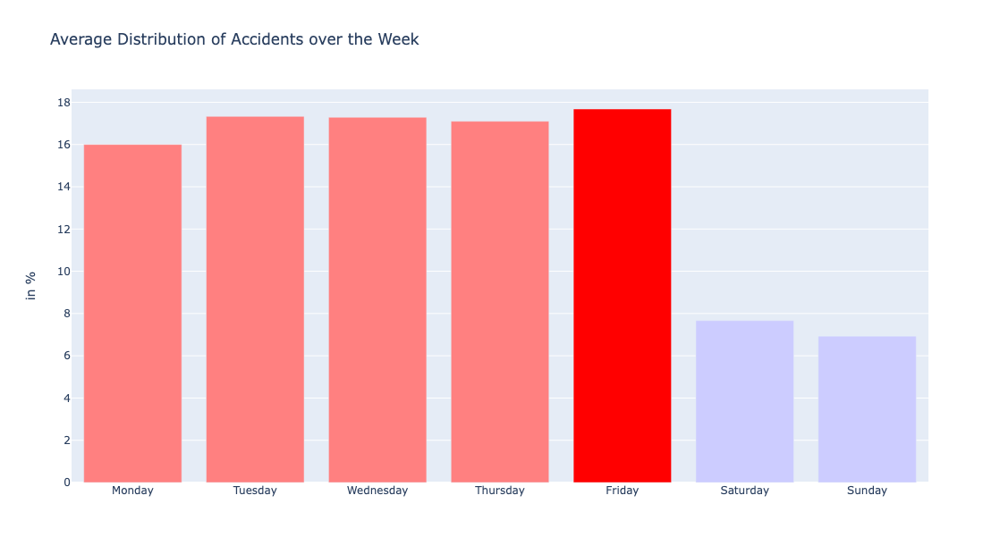

100.0


In [44]:
d = df_only_ymd.groupby(['Year', 'Weekday'], as_index=False)['Count_relativeToYear%'].sum().reset_index(drop=True).groupby('Weekday')['Count_relativeToYear%'].mean().reset_index()

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
d['Weekday'] = pd.Categorical(d['Weekday'], categories=weekday_order, ordered=True)
d = round((d.groupby('Weekday', as_index=False, observed=False)['Count_relativeToYear%'].sum()),3)
d_sorted = d.sort_values(by='Weekday')
d_sorted.reset_index(drop=True, inplace=True)

fig3 = go.Figure()

weekday_colors = ['#ff8080', '#ff8080', '#ff8080', '#ff8080', '#cc0000', '#ccccff', '#ccccff']
worstDay = d_sorted['Count_relativeToYear%'].max()
colors = ['#ff0000' if wd == worstDay else color for wd, color in zip(d_sorted['Count_relativeToYear%'], weekday_colors)]

bar = go.Bar(x=d_sorted['Weekday'], y=d_sorted['Count_relativeToYear%'], marker_color=colors)
fig3.add_trace(bar)
fig3.update_layout(title='Average Distribution of Accidents over the Week', height=620, width=700, yaxis=dict(title='in %'))
fig3.show()
print(round((d_sorted['Count_relativeToYear%'].sum()),2))

# pio.write_html(fig3, 'html-figures/weekday_figure.html', include_mathjax=False, include_plotlyjs=True)

For better visualisation: y-axis starts at 0 in order to see the relative difference between weekend and weekdays

Conclusion:
- Less accidents on the weekend (commute?)
- Most affected: Friday -> Parties, long travel for the weekend, tiredness, end of the week

### Analysing Severity (how long the accident causes traffic)

In [45]:
dfTime.groupby(['Severity'], as_index=True)['Count'].sum().nlargest(4).reset_index()

,Severity,Count
0,2,5222678
1,3,1113976
2,4,173629
3,1,38995


### Analysing the weather

#### Correlation between different weather conditions

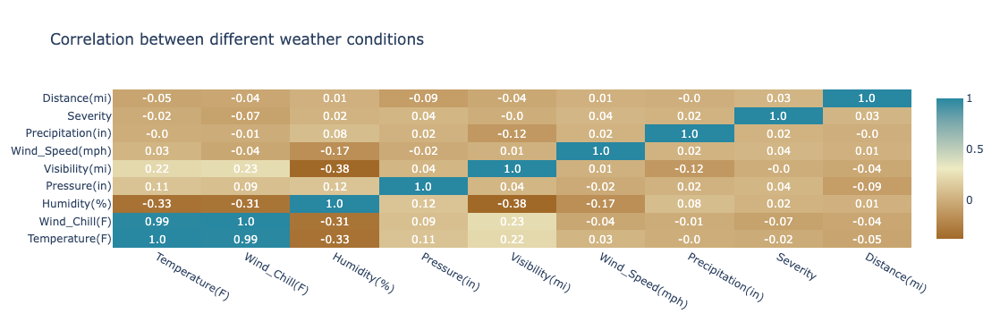

In [46]:
corr_weather = weather_df.corr()

fig_weather = go.Figure(data=go.Heatmap(z=corr_weather.values,
                                         x=corr_weather.columns,
                                         y=corr_weather.columns,
                                         colorscale='Earth',
                                         showscale=True))

annotations = []
for i, row in enumerate(corr_weather.values):
    for j, value in enumerate(row):
        annotations.append(
            dict(
                x=corr_weather.columns[j],
                y=corr_weather.columns[i],
                text=str(round(value, 2)),
                showarrow=False,
                font=dict(color='white')
            )
        )

fig_weather.update_layout(annotations=annotations, title='Correlation between different weather conditions')

fig_weather.show()


**Conclusion:** not very useful for preventing accidents (not very surprising information for target audience)

### --->>FINAL VISUAL: **Sum of accidents by different transport infrastructure**

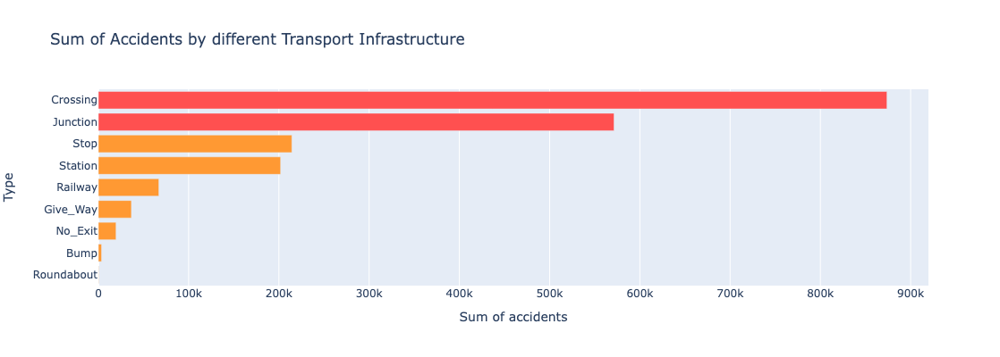

In [47]:
def calculate_Acc(poi):
    return poi_df[poi_df[poi]==True]['Count'].sum()

acc_bump = calculate_Acc('Bump')
acc_crossing = calculate_Acc('Crossing')
acc_giveway = calculate_Acc('Give_Way')
acc_junction = calculate_Acc('Junction')
acc_noexit = calculate_Acc('No_Exit')
acc_railway = calculate_Acc('Railway')
acc_roundabout = calculate_Acc('Roundabout')
acc_station = calculate_Acc('Station')
acc_stop = calculate_Acc('Stop')

data_pois = pd.DataFrame({'POI':['Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop'], 'SumAccidents':[acc_bump, acc_crossing, acc_giveway, acc_junction, acc_noexit, acc_railway, acc_roundabout, acc_station, acc_stop]})
 
# Sort data by sum of accidents
data_pois.sort_values(by='SumAccidents', ascending=True, inplace=True)

# Get the two highest sum of accidents
top_two = data_pois.nlargest(2, 'SumAccidents')

# Create a list of colors for each bar, color the two highest values in red
colors = ['#ff9933' if poi not in top_two['POI'].values else '#ff5050' for poi in data_pois['POI']]

                          
data_pois.sort_values(by='SumAccidents', ascending=True, inplace=True)
fig5 = go.Figure(data=go.Bar(y=data_pois['POI'], x=data_pois['SumAccidents'], orientation='h', marker_color=colors))
fig5.update_layout(
    width=900,
    height=400,
    title='Sum of Accidents by different Transport Infrastructure',
    xaxis_title='Sum of accidents',
    yaxis_title='Type')

fig5.show()

# pio.write_html(fig5, 'html-figures/poi_figure.html', include_mathjax=False, include_plotlyjs=True)

### Impact of hour of the day

#### by city -> not preferred

In [48]:
dfTime['City'].unique()

array(['Whitehall', 'Dublin', 'Dayton', ..., 'Ossian', 'Heltonville',
       'Eleanor'], dtype=object)

In [49]:
month_year_count = dfTime.groupby('Month')['Year'].nunique() #calculate nr of occurrencies of respective month
month_year_count_dict = month_year_count.to_dict()

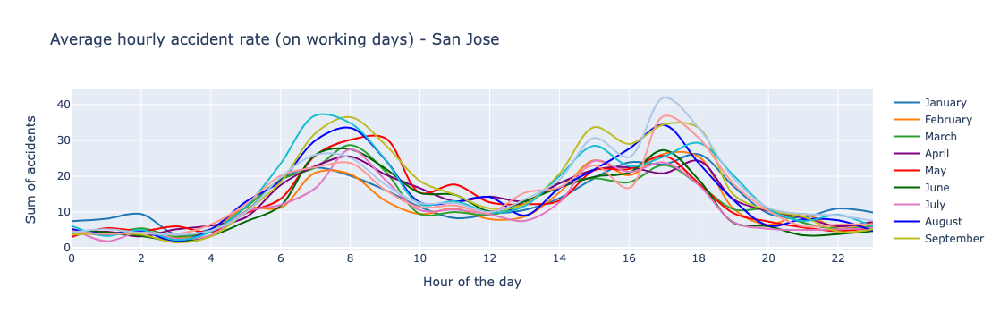

In [50]:
selected_city = 'San Jose'
subset_hourlydf = dfTime[~dfTime['Weekday'].isin(['Saturday', 'Sunday'])] #exclude weekend
subset_hourlydf = subset_hourlydf[['City', 'Count', 'Month', 'Day', 'Hour']]

def createDfToMonth(month):
        day_df = subset_hourlydf[(subset_hourlydf['City']==selected_city) & (subset_hourlydf['Month']==month)]
        d = day_df.groupby('Hour', as_index=True)['Count'].sum().reset_index().set_index('Hour')
        d['Count'] = d['Count'] / month_year_count_dict.get(month) #divide by occurences of month in total period
        return d
months=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
#assert every month with a certain color to help the user with readability / comparison
color_for_month = ['#1f77b4', '#ff7f0e', '#2ca02c', 'purple', 'red', 'darkgreen', '#e377c2', 'blue', '#bcbd22', '#17becf', '#ff9896', '#aec7e8']
fig6 = go.Figure()
for i in range(1, 13):
    d = createDfToMonth(i)
    #fill missing hours & associate for count default value 0
    unique_hours = d.index
    x_vals =  list(range(0,24))
    y_vals = [0] * 24
    for h in unique_hours:
        y_vals[h] = d.loc[h, 'Count'] #fill existent data 
    fig6.add_trace(go.Scatter(x=x_vals, y=y_vals, mode='lines', line_shape='spline', name=months[i-1], line=dict(color=color_for_month[i-1], width=2)))
#update intervals for better readability
fig6.update_layout(title=('Average hourly accident rate (on working days) - '+str(selected_city)), xaxis_title='Hour of the day', yaxis_title='Sum of accidents',
                       xaxis=dict(tickmode='array', tickvals=list(range(0, 23, 2))))
fig6.show()

#### --------->>FINAL VISUAL: **Average hourly sum of accidents by different months (regarding working days)**

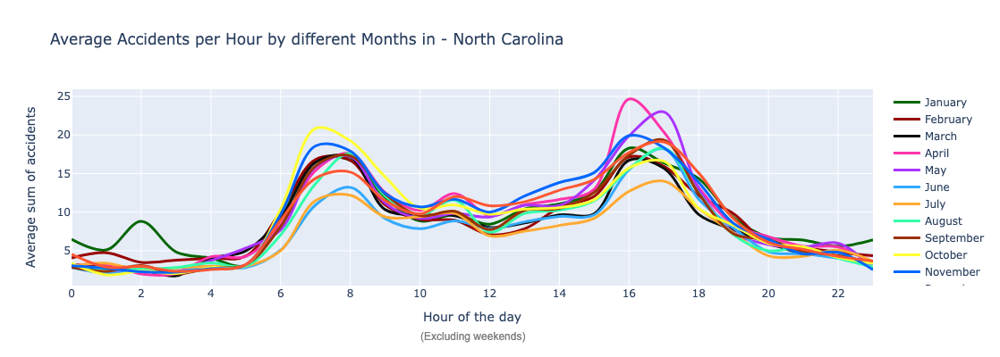

In [51]:
selected_state = 'North Carolina'

subset_selected_state = df_avgHourlyMonth[df_avgHourlyMonth['State_fullName']==selected_state].reset_index() # filter by state
# we get the sum of accidents for every hour that existed throughout the recorded period and then get the average for every month and hour
averageAccPerMonthHour_df = round((subset_selected_state.groupby(['Year', 'Month', 'Day', 'Hour'])['Count'].sum().reset_index().groupby(['Month', 'Hour'])['Count'].mean()),2).reset_index()

months=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
#assert every month with a certain color to help the user with readability / comparison
color_for_month = ['#006600', '#990000', '#0d0d0d', '#FF33AA', '#AA33FF', '#33AAFF', '#FFAA33', '#33FFAA', '#993300', '#FFFF33', '#0066ff', '#FF5733']
fig6 = go.Figure()
for i in range(0,13):
    filtered_df = averageAccPerMonthHour_df[averageAccPerMonthHour_df['Month']==i]
    fig6.add_trace(go.Scatter(x=list(range(0,24)), y=filtered_df['Count'], mode='lines', name=months[i-1], line=dict(width=3, color=color_for_month[i-1], shape='spline'))) 


#update intervals
fig6.update_layout(title=('Average Accidents per Hour by different Months in - '+str(selected_state)), xaxis_title='Hour of the day', yaxis_title='Average sum of accidents',
                    xaxis=dict(tickmode='array', tickvals=list(range(0, 24, 2))),
                   height=400,
                   width=1000,
                    annotations=[dict(
                    text="(Excluding weekends)",
                    showarrow=False,
                    xref="paper",
                    yref="paper",
                    x=0.5,
                    y=-0.3,
                    font=dict(
            family="Arial",
            size=12,
            color="grey"
        )
    )])
fig6.show()

#pio.write_html(fig6, 'html-figures/hourlyMonth_figure.html', include_mathjax=False, include_plotlyjs=True)

#### Analysing sunset

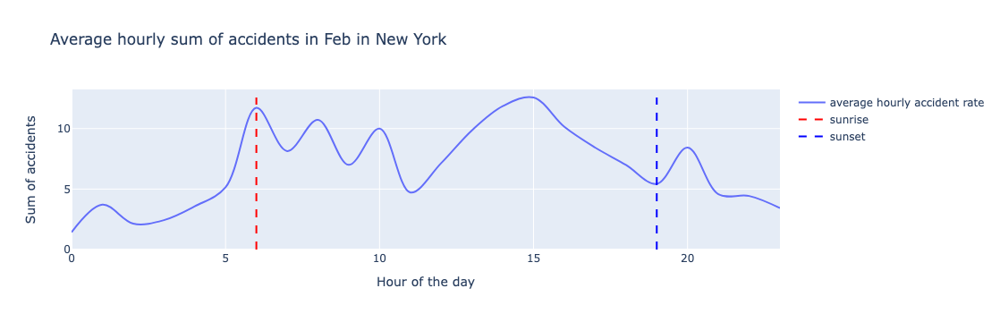

In [52]:
subset_hourlydf = dfTime[['City', 'Month', 'Day', 'Hour', 'Minute', 'Nautical_Twilight', 'Count']]
city = 'New York'
year = 2019
month = 2

def createDfToMonth(month):
    day_df = subset_hourlydf[(subset_hourlydf['City']==city) & (subset_hourlydf['Month']==month)]
    return day_df.groupby(['Hour'], as_index=True)['Count'].sum().reset_index().set_index('Hour')
df_to_month = createDfToMonth(month)

#calculate occurrences of month in the whole period: years 2016-2023 excluding 2020 -> 7 years
#Feb 2016-end of March 2023
occ_months = [6,7,7,6,6,6,6,6,6,6,6,6]

df_to_month['Count'] = df_to_month['Count'] / occ_months[month-1] #divide by occ of month to get average hourly accident rate, not total

naut_df = subset_hourlydf[(subset_hourlydf['City']==city) & (subset_hourlydf['Month']==month)].groupby('Hour', as_index=True)['Nautical_Twilight'].first().reset_index().set_index('Hour')
sunrise=5
sunset=19
for i in naut_df.index:
    if (naut_df.loc[i, 'Nautical_Twilight']=='Day'):
        sunrise = i
        break
for i in range(sunrise+4, len(naut_df)):
    if (naut_df.loc[i, 'Nautical_Twilight']=='Night'):
        sunset = i
        break  
   
months=['Jan', 'Feb', 'Mar', 'Apr', 'Mai', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
fig6 = go.Figure()

unique_hours = df_to_month.index
#filling missing hours with default 0
x_vals =  list(range(0,24))
y_vals = [0] * 24
for h in unique_hours: #iterate over all unique hours
    y_vals[h] = df_to_month.loc[h, 'Count']

fig6.add_trace(go.Scatter(x=x_vals, y=y_vals, mode='lines', line_shape='spline', name='average hourly accident rate', showlegend=True))
fig6.add_shape(type='line',
              x0=sunrise, y0=0,
              x1=sunrise, y1=max(df_to_month['Count']),
              line=dict(color='red', width=2, dash='dash'), name='sunrise', showlegend=True)
fig6.add_shape(type='line',
              x0=sunset, y0=0,
              x1=sunset, y1=max(df_to_month['Count']),
              line=dict(color='blue', width=2, dash='dash'), name='sunset', showlegend=True)
fig6.update_layout(title=('Average hourly sum of accidents in '+months[month-1]+' in '+str(city)), xaxis_title='Hour of the day', yaxis_title='Sum of accidents')
fig6.show()

- It's better to use relative values; otherwise, it might seem like there are 60 accidents per hour in July (even though it's summed up for all 7 years).
- Problem: Missing data for smaller cities (graph has gaps/ends in the middle of the day) -> Solution: Only offer larger cities (cities with the most accidents) for selection.
- Reasons for deciding against the visualization: Insufficient data on sunset & sunrise; only available for accidents (one would need to collect data for sunrise & sunset for each city using APIs/webscraping, taking daylight saving time into account, and visualize accordingly).

### Most affected cities by accidents

In [53]:
round(dfTime.groupby(['Year', 'City'])['Count'].sum().reset_index().groupby('City')['Count'].mean().nlargest(20)).reset_index()

,City,Count
0,Miami,22831.0
1,Houston,21361.0
2,Los Angeles,18843.0
3,Charlotte,16950.0
4,Dallas,16165.0
5,Orlando,13984.0
6,Austin,12323.0
7,Raleigh,10560.0
8,Baton Rouge,8573.0
9,Nashville,8535.0


### Most affected states by accidents

In [54]:
round(dfTime.groupby(['Year', 'State'])['Count'].sum().reset_index().groupby('State')['Count'].mean().nlargest(10)).reset_index()

,State,Count
0,CA,207985.0
1,FL,107114.0
2,TX,72764.0
3,SC,45681.0
4,NY,42734.0
5,NC,41367.0
6,VA,36928.0
7,PA,36204.0
8,MN,21841.0
9,MI,20918.0


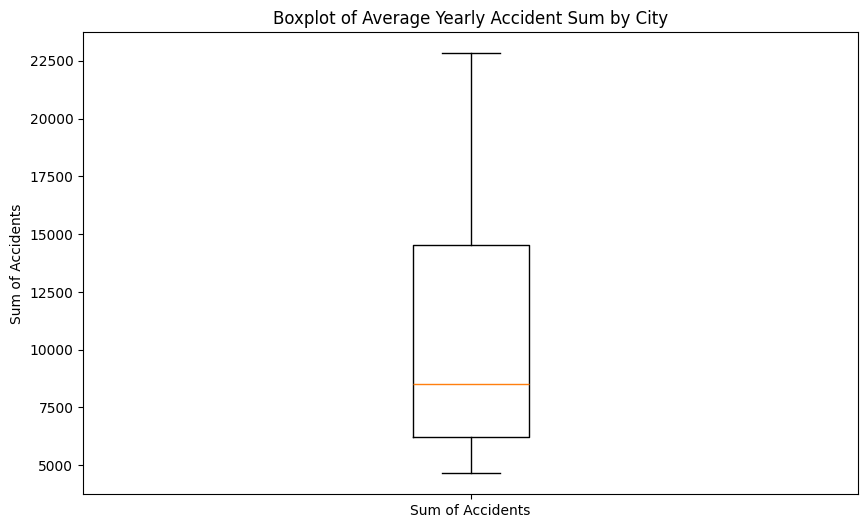

In [55]:
# group by city and get average sum of accidents
city_accidents_sum = round(dfTime.groupby(['Year', 'City'])['Count'].sum().reset_index().groupby('City')['Count'].mean().nlargest(20))

# Convert the Series to a DataFrame
city_accidents_sum_df = city_accidents_sum.to_frame()

pp.figure(figsize=(10, 6))
pp.boxplot(city_accidents_sum_df['Count'], showfliers=True)
pp.xticks([1], ['Sum of Accidents'])
pp.title('Boxplot of Average Yearly Accident Sum by City')
pp.ylabel('Sum of Accidents')
pp.show()

### States with most accidents per Year on average

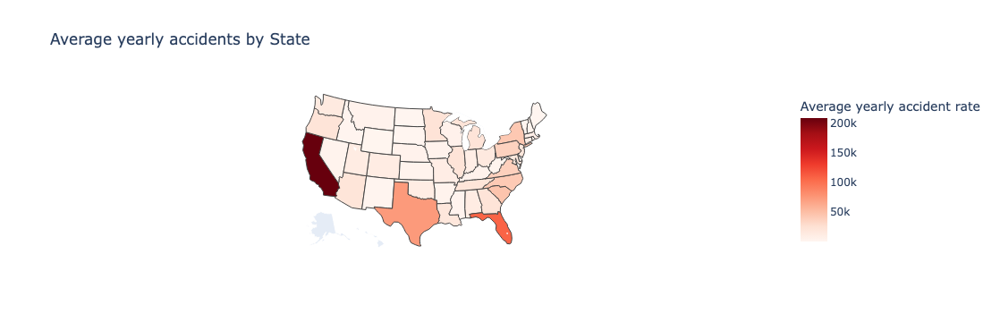

In [56]:
avgAccPerYear_stateDf = round(dfTime.groupby(['Year', 'State'])['Count'].sum().reset_index().groupby('State')['Count'].mean()).reset_index()
state_accidents = avgAccPerYear_stateDf

# Create the choropleth map
fig = go.Figure(go.Choropleth(
    locations=state_accidents['State'],  # State abbreviations
    z=state_accidents['Count'],  # Values to be color-mapped
    locationmode='USA-states',  # Use USA state abbreviations
    colorscale='Reds',  # Color scale for the map
    colorbar_title='Average yearly accident rate',  # Title for the color bar
))

# Set the title and layout
fig.update_layout(
    title_text='Average yearly accidents by State',  # Title of the plot
    geo=dict(
        scope='usa',  # Map scope to USA
    )
)

# Show the map
fig.show()

#pio.write_html(fig, file='chloropleth_state.html', auto_open=True)

### Analysing mean Severity

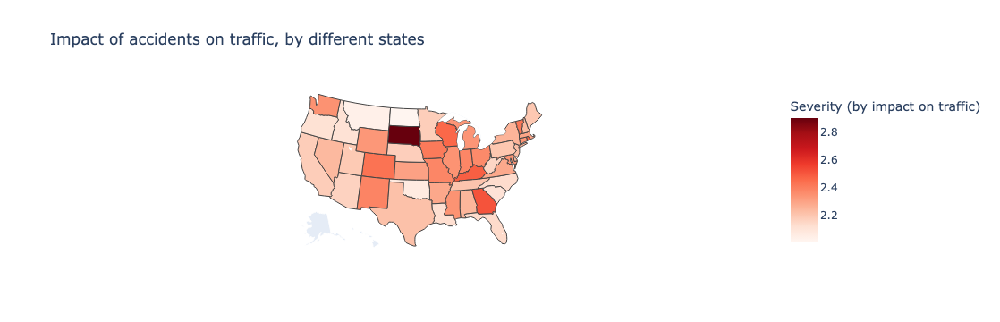

In [57]:
state_accidents = dfTime.groupby('State')['Severity'].mean().reset_index()

# Create the choropleth map
fig = go.Figure(go.Choropleth(
    locations=state_accidents['State'],  # State abbreviations
    z=state_accidents['Severity'],  # Values to be color-mapped
    locationmode='USA-states',  # Use USA state abbreviations
    colorscale='Reds',  # Color scale for the map
    colorbar_title='Severity (by impact on traffic)',  # Title for the color bar
))

# Set the title and layout
fig.update_layout(
    title_text='Impact of accidents on traffic, by different states',  # Title of the plot
    geo=dict(
        scope='usa',  # Map scope to USA
    )
)

# Show the map
fig.show()

**Conclusion:** not very valuable because there are no big differences with exception of one state

### Mapbox

#### -------->>FINAL VISUAL: **Overview of all accidents in selected state**

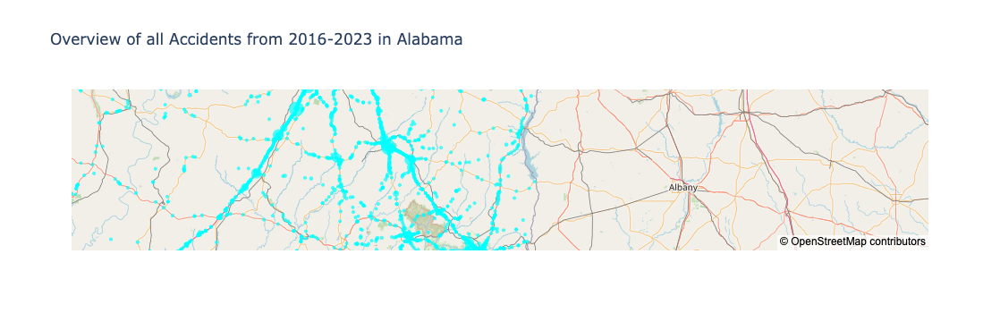

In [61]:
state = 'AL'

city_accidents = df_accScattermap[df_accScattermap['State']==state].groupby(['City', 'Street', 'Start_Lat', 'Start_Lng']).size().reset_index(name='Accidents')
randomStartingPoint = city_accidents.iloc[0,0]
randomLat = city_accidents.loc[0,'Start_Lat']
randomLng = city_accidents.loc[0,'Start_Lng']

hover_text = city_accidents['City'] + '<br>' + 'Street: ' + city_accidents['Street'].astype(str) + '<br>' + 'Accidents: ' + city_accidents['Accidents'].astype(str)

max_marker_size = city_accidents['Accidents'].max()
min_marker_size = city_accidents['Accidents'].min()

new_min_marker_size = 5  # choose a suitable minimum size
new_max_marker_size = 50  # choose a suitable maximum size

# scale the marker sizes
scaled_marker_sizes = np.interp(city_accidents['Accidents'], (min_marker_size, max_marker_size), (new_min_marker_size, new_max_marker_size))

fig7 = go.Figure(go.Scattermapbox(
    lat=city_accidents['Start_Lat'],
    lon=city_accidents['Start_Lng'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=scaled_marker_sizes,  # Size of the bubble based on the number of accidents, adjusted to make even small bubbles visible
        color='#00ffff',  # You can customize the marker color
        opacity=0.7 #in order to see the city names
    ),
    text=hover_text,  # Display the city name in the hover tooltip
))

stateName = abbr_to_full[abbr_to_full['Abbreviation']==state].reset_index().loc[0, 'Full_Name']
fig7.update_layout(
    title='Overview of all Accidents from 2016-2023 in '+stateName,
    mapbox_style="open-street-map",  # Change map style
    mapbox=dict(
        zoom=7,
        center=dict(lat=randomLat, lon=randomLng),  # Set initial center of the map where the selected city is located
    )
)
# pio.write_html(fig7, file='html-figures/scattermap_AL.html', auto_open=True)

In [59]:
df_accScattermap['State_fullName'].unique()

array(['Pennsylvania', 'Ohio', 'Indiana', 'Kentucky', 'West Virginia',
       'Michigan', 'California', 'Connecticut', 'New Jersey', 'New York',
       'Massachusetts', 'Delaware', 'Nebraska', 'Rhode Island', 'Iowa',
       'Minnesota', 'Maryland', 'Missouri', 'Maine', 'New Hampshire',
       'South Dakota', 'Wisconsin', 'Nevada', 'Illinois',
       'South Carolina', 'Florida', 'Washington', 'Texas', 'Arkansas',
       'Tennessee', 'Virginia', 'Georgia', 'Louisiana', 'Kansas', 'Idaho',
       'Arizona', 'North Carolina', 'Utah', 'District of Columbia',
       'Colorado', 'Oklahoma', 'Oregon', 'Mississippi', 'Alabama',
       'New Mexico', 'Montana', 'Wyoming', 'Vermont', 'North Dakota'],
      dtype=object)

- Chose light blue color for high contrast with red, orange-yellow, and green roads (preferred red, but many highways are red).
- User-friendliness: Convert abbreviations into full names in the dropdown menu.

#### Top 10 most dangerous roads in State

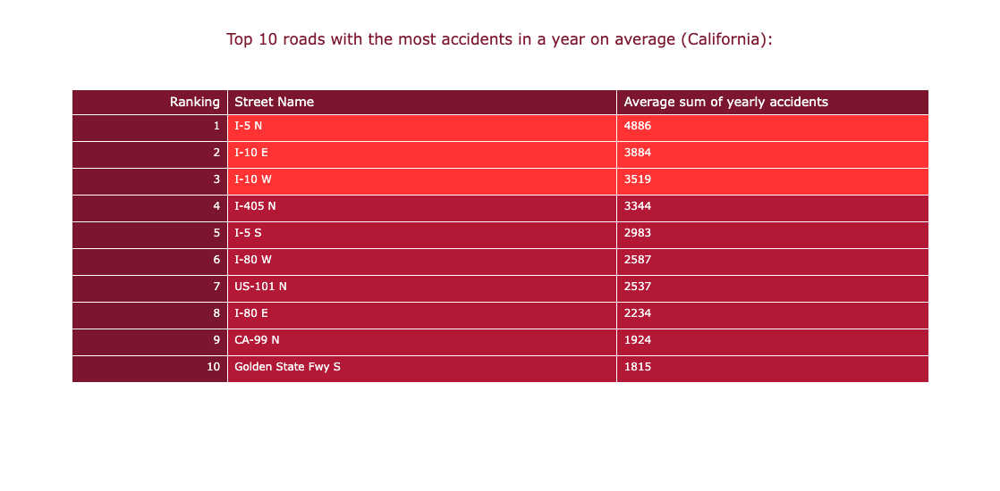

In [60]:
state_df = df_accScattermap[df_accScattermap['State_fullName']=='California'].reset_index()
# round to full nr for better comprehension (there cannot be .7 accident)
# selecting the average so that unique accidents (exceptions) do not alter the result too heavily
worst_roads_df = round(state_df.groupby(['Year', 'Street'])['Count'].sum().reset_index().groupby('Street')['Count'].mean()).nlargest(10).reset_index()
worst_roads_df.index = worst_roads_df.index + 1

col2 = '#b31936'
col1 = '#7c162e'
worst_color = '#ff3333'

fig = go.Figure(data=[go.Table(columnorder = [1, 2, 3], columnwidth = [40, 100, 80],
                               
                               header=dict(values=['Ranking', 'Street Name', 'Average sum of yearly accidents'],
                                          line_color='white',
                                          fill_color=col1,
                                           font=dict(color='white', size=14),
                                          align=['right', 'left', 'left']),
                               
                               cells=dict(values=[worst_roads_df.index, worst_roads_df['Street'], worst_roads_df['Count']], align=['right', 'left', 'left'],
                              font=dict(color=['white', 'white', 'white'], size=12), height=30, 
                                          fill=dict(color=[col1, [worst_color]*3 + [col2] * (len(worst_roads_df) - 3), [worst_color]*3 + [col2] * (len(worst_roads_df) - 3)]))
                              )])
fig.update_layout(width=900, height=550, title=dict(
        text="Top 10 roads with the most accidents in a year on average (California):",
        font=dict(color=col1),  
        x=0.5),
                 annotations=[dict(
        text="",
        showarrow=False,
        xref="paper",
        yref="paper",
        x=0.5,
        y=-0.2,
        font=dict(
            family="Arial",
            size=12,
            color="grey"
        )
    )])

# save it as JSON file
'''figure_dict = fig.to_dict()
with open('holiday_figure.py', 'w') as file:
    json.dump(figure_dict, file)'''

fig.show()